# Laboratory 4: Point Operators

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Pixels transforms

## Image Enhancement

In [2]:
import cv2
import sys

img = cv2.imread("/content/drive/MyDrive/Computer vision/Lab04/Images/lowlight_1.jpg" )

if img is None:
    sys.exit("Could not read the image.")

In [3]:
import matplotlib.pyplot as plt

In [4]:
import numpy as np

print(np.max(img))
print(np.min(img))
print(img.dtype)

255
0
uint8


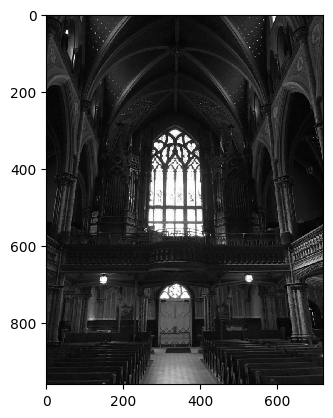

In [ ]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Linear Operation

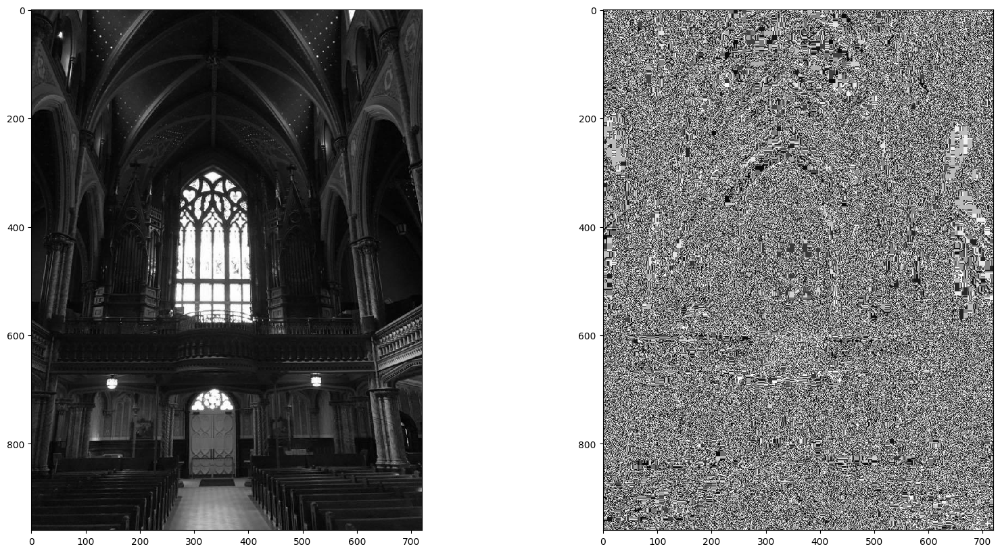

In [ ]:
# Try to vary this gain and bias numbers, and see the result
gain = 100
bias = 0

img_gray_edited = gain*img_gray + bias
img_gray_edited_unit8 = np.clip(img_gray_edited, 0, 255).astype('uint8')

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_gray_edited_unit8, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

Let visualize it in histogram !

Text(0.5, 0, 'Intensity Value')

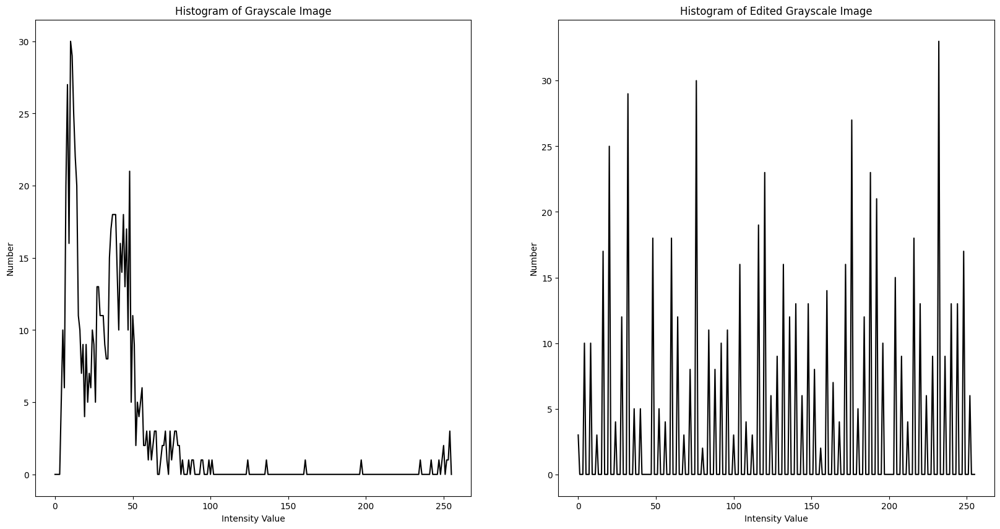

In [ ]:
histogram_gray = cv2.calcHist(img_gray, [0], None, [256], [0, 256])
histogram_gray_edit = cv2.calcHist(img_gray_edited_unit8, [0], None, [256], [0, 256])

# Plot Histogram
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.plot(histogram_gray, color='k')
ax1.set_title('Histogram of Grayscale Image')
ax1.set_ylabel('Number')
ax1.set_xlabel('Intensity Value')

ax2.plot(histogram_gray_edit, color='k')
ax2.set_title('Histogram of Edited Grayscale Image')
ax2.set_ylabel('Number')
ax2.set_xlabel('Intensity Value')


In [ ]:
# Add your code here for RGB color image.
# Try to adjust the color intensity using linear operator.
# Try other color space (e.g. L*a*b*)

# Try to vary this gain and bias numbers, and see the result
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gain = 10
bias = 0

img_rgb_edited = gain*img_rgb + bias
img_rgb_edited_unit8 = np.clip(img_rgb_edited, 0, 255).astype('uint8')

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(img_rgb_edited_unit8, cv2.COLOR_BGR2RGB))
plt.show()

Output hidden; open in https://colab.research.google.com to view.

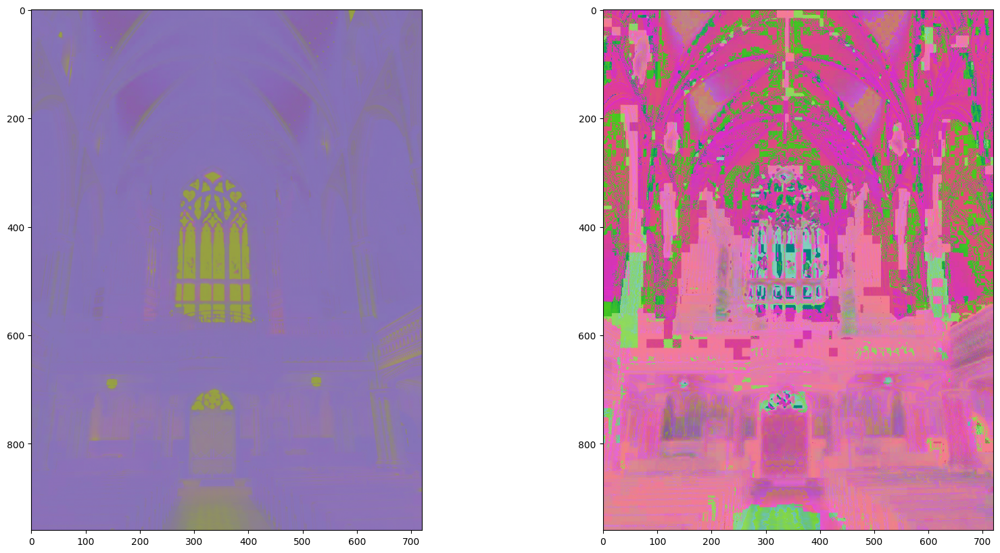

In [ ]:
# Try to vary this gain and bias numbers, and see the result
img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
gain = 250
bias = 0

img_lab_edited = gain*img_lab + bias
img_lab_edited_unit8 = np.clip(img_lab_edited, 0, 255).astype('uint8')

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(img_lab, cv2.COLOR_BGR2Lab))
ax2.imshow(cv2.cvtColor(img_lab_edited_unit8, cv2.COLOR_BGR2Lab))
plt.show()

### Gamma correction

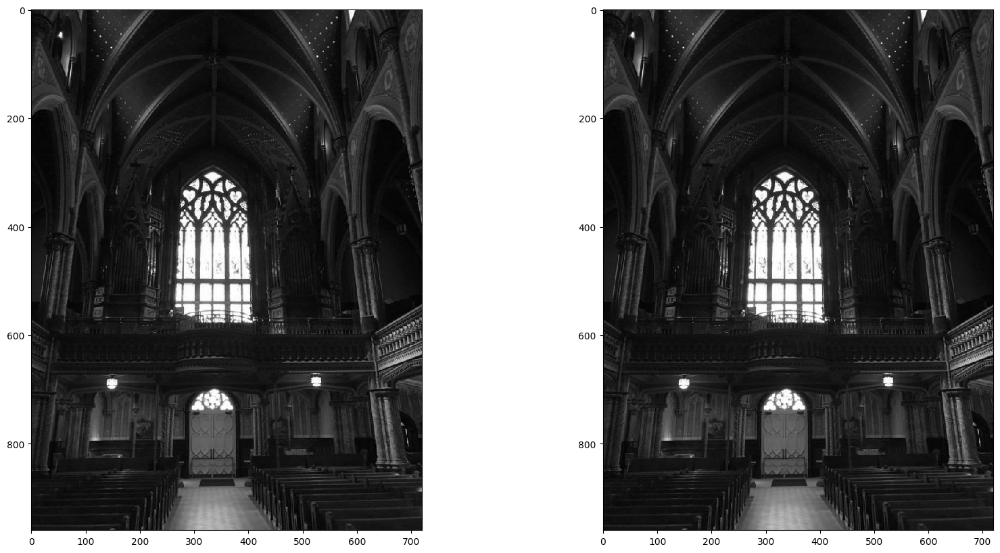

In [ ]:
# Try to vary gamma
gamma = 1.0

lookUpTable = np.empty((1,256), np.uint8)
for i in range(256):
    lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)

image_gray_gamma = cv2.LUT(img_gray, lookUpTable)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(image_gray_gamma, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

Text(0.5, 0, 'Intensity Value')

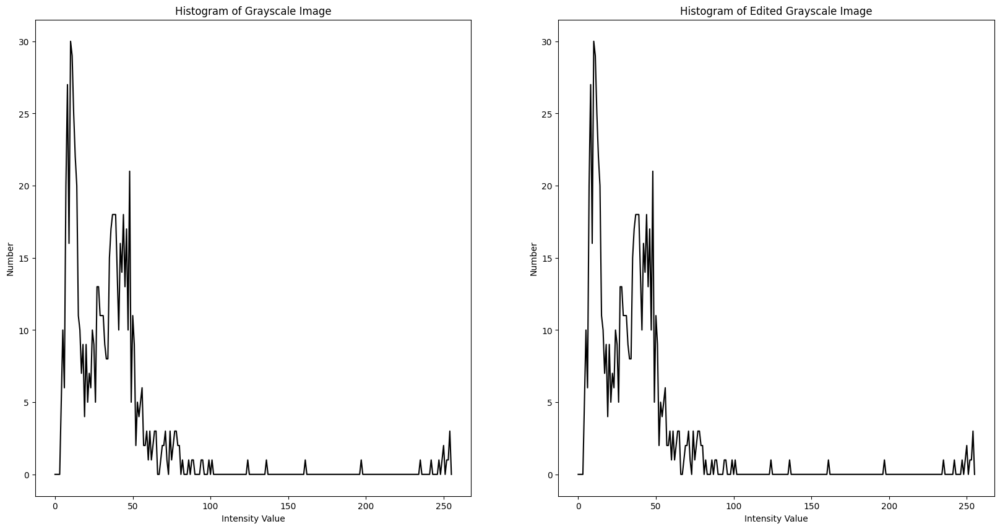

In [ ]:
histogram_gray = cv2.calcHist(img_gray, [0], None, [256], [0, 256])
histogram_gray_edit = cv2.calcHist(image_gray_gamma, [0], None, [256], [0, 256])

# Plot Histogram
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.plot(histogram_gray, color='k')
ax1.set_title('Histogram of Grayscale Image')
ax1.set_ylabel('Number')
ax1.set_xlabel('Intensity Value')

ax2.plot(histogram_gray_edit, color='k')
ax2.set_title('Histogram of Edited Grayscale Image')
ax2.set_ylabel('Number')
ax2.set_xlabel('Intensity Value')

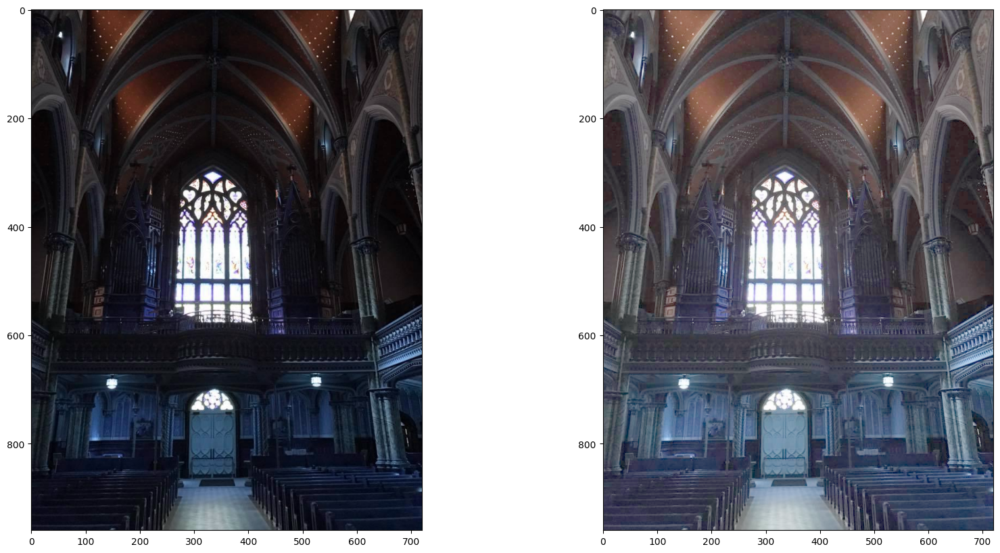

In [ ]:
# Add your code here for RGB color image.
# Try to adjust the color intensity using Gamma correction.
# Try other color space (e.g. L*a*b*)

# Try to vary gamma
gamma = 0.5

lookUpTable = np.empty((1,256), np.uint8)
for i in range(256):
    lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)

image_rgb_gamma = cv2.LUT(img_rgb, lookUpTable)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(image_rgb_gamma, cv2.COLOR_BGR2RGB))
plt.show()

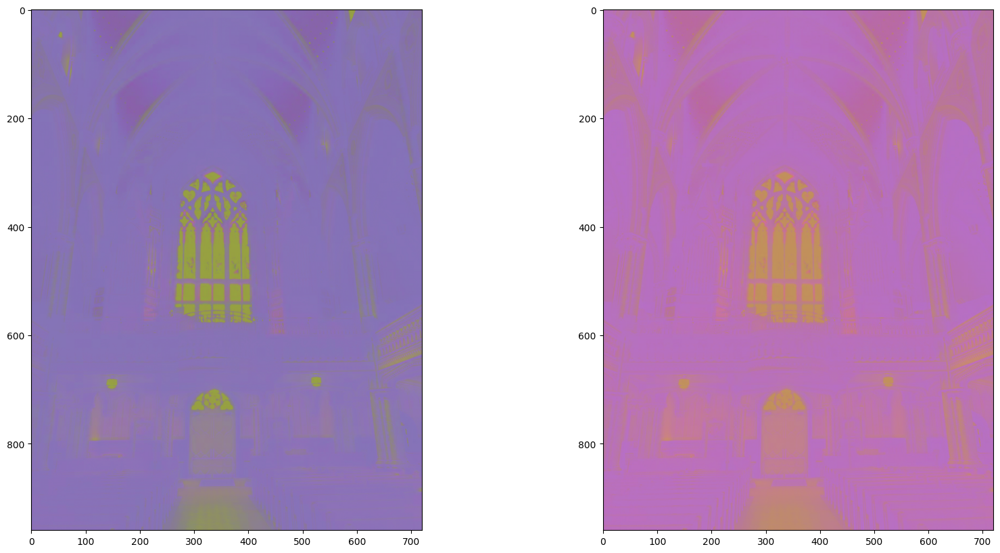

In [ ]:
# Try to vary gamma
gamma = 0.5

lookUpTable = np.empty((1,256), np.uint8)
for i in range(256):
    lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)

img_lab_gamma = cv2.LUT(img_lab, lookUpTable)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(img_lab, cv2.COLOR_BGR2Lab))
ax2.imshow(cv2.cvtColor(img_lab_gamma, cv2.COLOR_BGR2Lab))
plt.show()

### Histogram Equalization

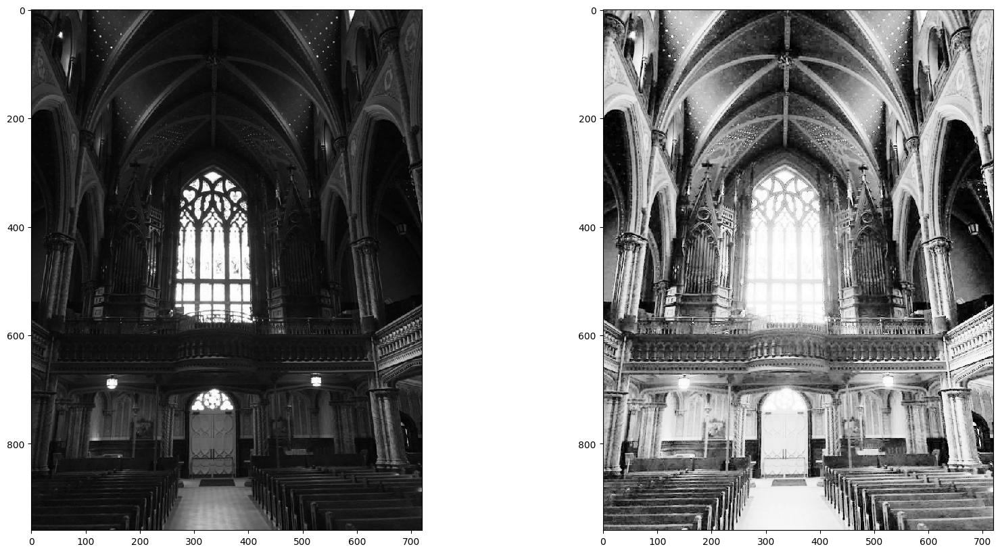

In [ ]:
img_gray_hist_eq = cv2.equalizeHist(img_gray)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_gray_hist_eq, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

Text(0.5, 0, 'Intensity Value')

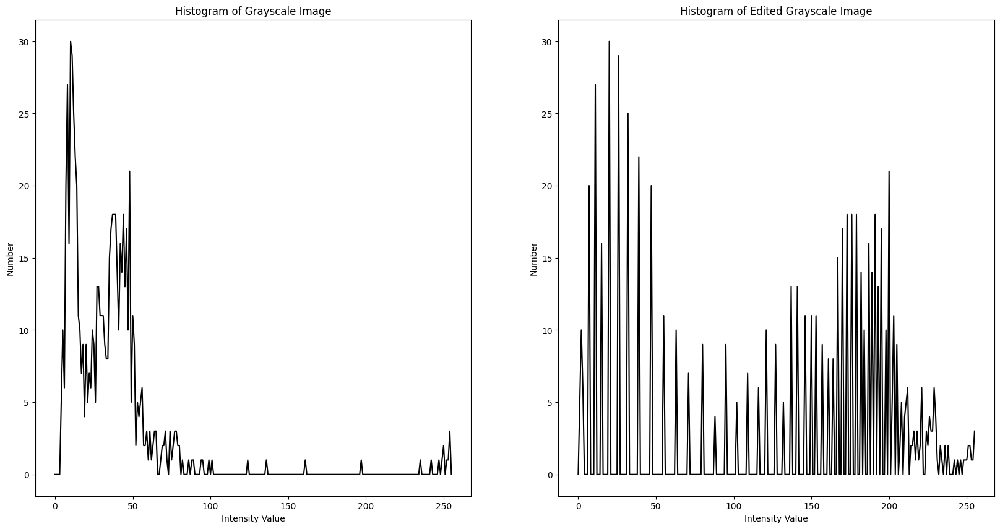

In [ ]:
histogram_gray = cv2.calcHist(img_gray, [0], None, [256], [0, 256])
histogram_gray_edit = cv2.calcHist(img_gray_hist_eq, [0], None, [256], [0, 256])

# Plot Histogram
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.plot(histogram_gray, color='k')
ax1.set_title('Histogram of Grayscale Image')
ax1.set_ylabel('Number')
ax1.set_xlabel('Intensity Value')

ax2.plot(histogram_gray_edit, color='k')
ax2.set_title('Histogram of Edited Grayscale Image')
ax2.set_ylabel('Number')
ax2.set_xlabel('Intensity Value')

In [ ]:
# Add your code here for RGB color image.
# Try to adjust the color intensity using Histogram Equalization.
# Try other color space (e.g. L*a*b*)


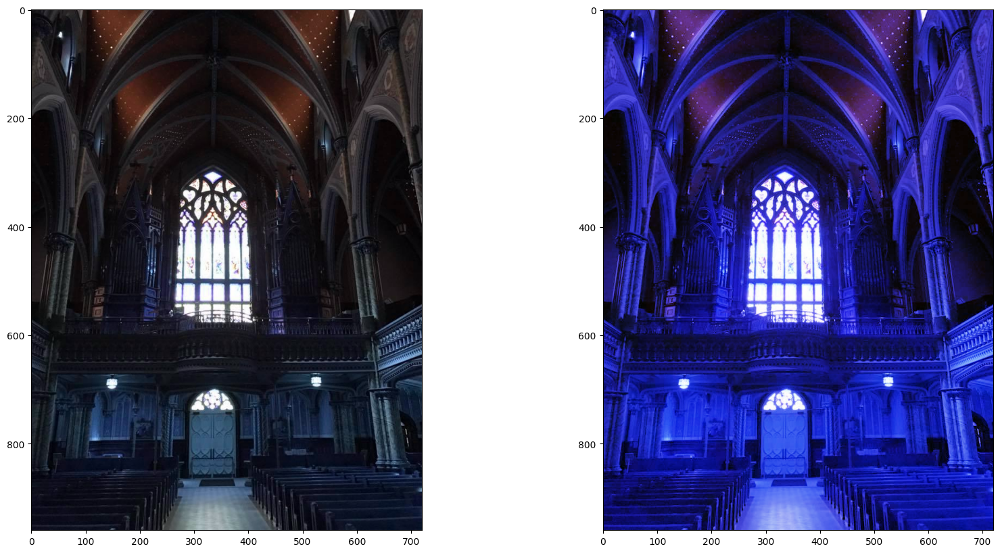

In [ ]:
img_rgb_test = img_rgb.copy()
img_rgb_test[:,:,0] = cv2.equalizeHist(img_rgb_test[:,:,0])
img_rgb_hist_eq = img_rgb_test
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(img_rgb_hist_eq, cv2.COLOR_BGR2RGB))
plt.show()

Text(0.5, 0, 'Intensity Value')

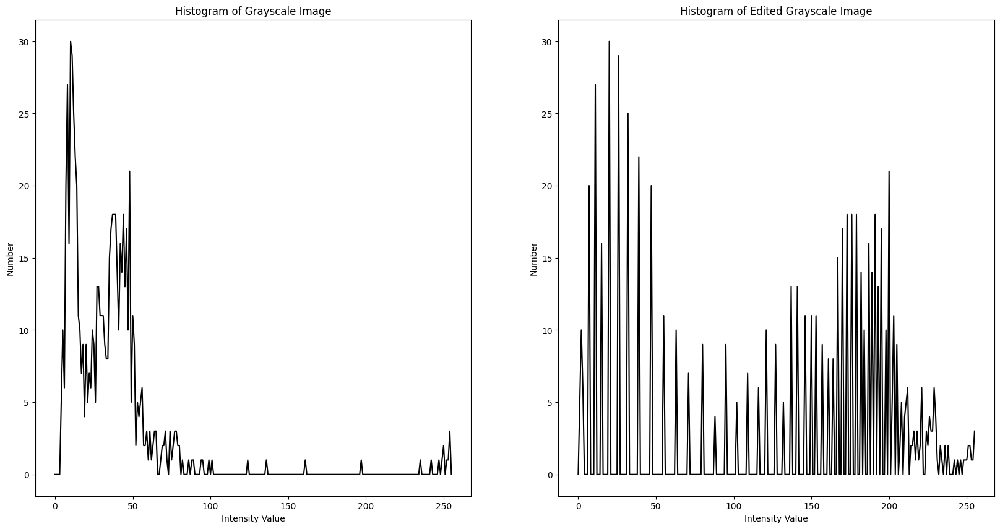

In [ ]:
histogram_gray = cv2.calcHist(img_gray, [0], None, [256], [0, 256])
histogram_gray_edit = cv2.calcHist(img_gray_hist_eq, [0], None, [256], [0, 256])

# Plot Histogram
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.plot(histogram_gray, color='k')
ax1.set_title('Histogram of Grayscale Image')
ax1.set_ylabel('Number')
ax1.set_xlabel('Intensity Value')

ax2.plot(histogram_gray_edit, color='k')
ax2.set_title('Histogram of Edited Grayscale Image')
ax2.set_ylabel('Number')
ax2.set_xlabel('Intensity Value')

## Image Matting and Compositing

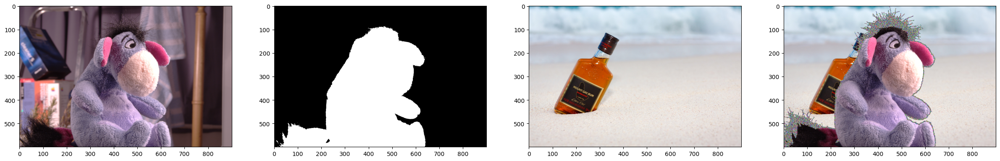

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Read the images
foreground = cv2.imread("/content/drive/MyDrive/Computer vision/Lab04/Images/GT24_color.png")
background = cv2.imread("/content/drive/MyDrive/Computer vision/Lab04/Images/background.jpg")
alpha = cv2.imread("/content/drive/MyDrive/Computer vision/Lab04/Images/GT24_alpha.png")

foreground = cv2.resize(foreground, (900,600), interpolation= cv2.INTER_LINEAR)
background = cv2.resize(background, (900,600), interpolation= cv2.INTER_LINEAR)
alpha = cv2.resize(alpha, (900,600), interpolation= cv2.INTER_LINEAR)

# Convert uint8 to float
foreground = foreground.astype(float)
background = background.astype(float)

# Normalize the alpha mask to keep intensity between 0 and 1
alpha = alpha.astype(float)/255

# Multiply the foreground with the alpha matte
foreground_alpha = cv2.multiply(alpha, foreground)

# Multiply the background with ( 1 - alpha )
background_alpha = cv2.multiply(1.0 - alpha, background)

# Add the masked foreground and background.
outImage = cv2.add(foreground_alpha, background_alpha)*255

foreground = foreground.astype('uint8')
alpha = alpha.astype('uint8')*255
background = background.astype('uint8')
outImage = outImage.astype('uint8')*255

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 30))
ax1.imshow(cv2.cvtColor(foreground, cv2.COLOR_BGR2RGB))
ax2.imshow(cv2.cvtColor(alpha, cv2.COLOR_BGR2RGB))
ax3.imshow(cv2.cvtColor(background, cv2.COLOR_BGR2RGB))
ax4.imshow(cv2.cvtColor(outImage, cv2.COLOR_BGR2RGB))
plt.show()

# Bonus Assignment:

In [ ]:
# Read the image "rainbow.png". Apparently, there is a rainbow on this image!
# If you try hard enough, we can see the rainbow.
# Those who can give me the rainbow will get a reward (Extra score on the midterm exam !)

In [172]:
rainbow = cv2.imread('/content/drive/MyDrive/Computer vision/Lab04/Images/rainbow.png')

In [173]:
rainbow.shape

(648, 975, 3)

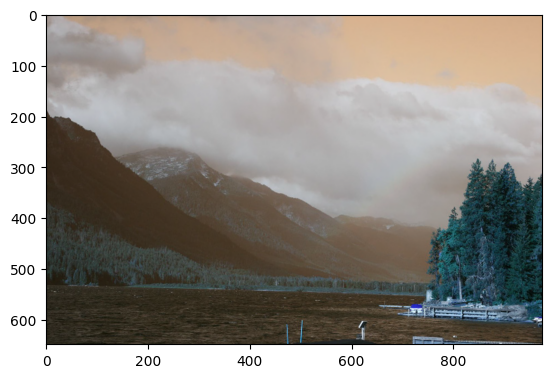

In [174]:
plt.imshow(rainbow)

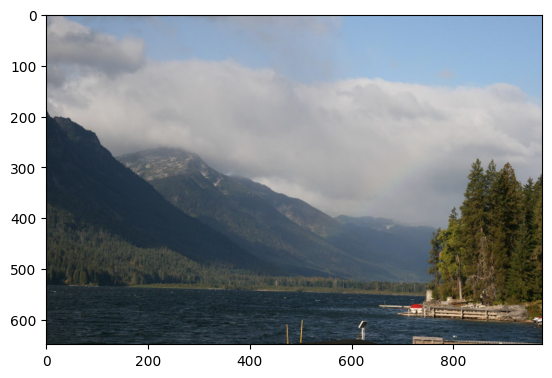

In [175]:
img_rgb = cv2.cvtColor(rainbow, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

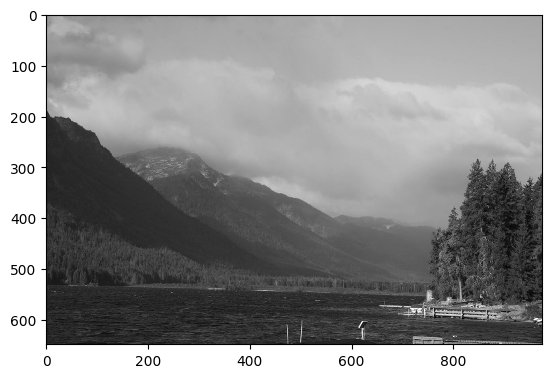

In [176]:
img_gray = cv2.cvtColor(rainbow, cv2.COLOR_BGR2GRAY)
plt.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')

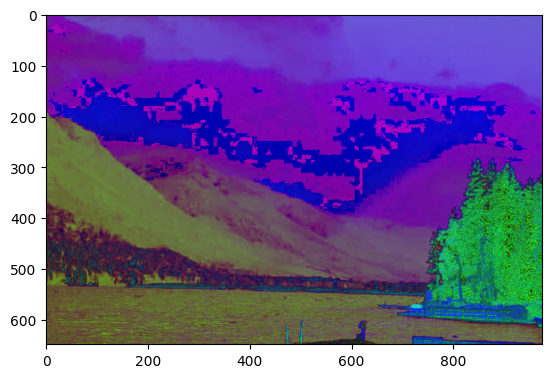

In [177]:
img_hsv = cv2.cvtColor(rainbow, cv2.COLOR_BGR2HSV)
plt.imshow(img_hsv)
plt.show()

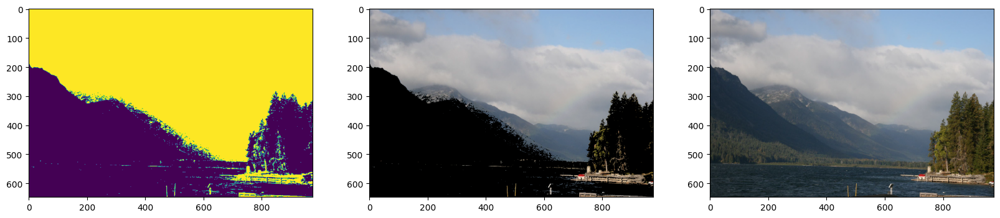

In [178]:
hsv = cv2.cvtColor(rainbow, cv2.COLOR_BGR2HSV)

# แยกช่อง Hue ออกมา
hue = hsv[:, :, 0]
sti = hsv[:, :, 1]
value = hsv[:, :, 2]

# กำหนดค่า Threshold สำหรับ Hue ของสายรุ้ง
lower_hue = 0
upper_hue = 300 #180

lower_value = 0
upper_value = 100

lower_sti = 0
upper_sti = 100

# สร้าง Mask สำหรับสายรุ้ง
mask_hue = cv2.inRange(hsv, lower_hue, upper_hue)
mask_value = cv2.inRange(value , lower_value, upper_value)
mask_sti = cv2.inRange(hsv , lower_sti, upper_sti)

mask = mask_hue + mask_value #+ mask_sti
mask = np.invert(mask)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
# แสดงภาพ Mask
ax1.imshow(mask)

# ใช้ Mask กับภาพต้นฉบับ
masked_img = cv2.bitwise_and(hsv, hsv, mask=mask)

# แสดงภาพผลลัพธ์
ax2.imshow(cv2.cvtColor(masked_img, cv2.COLOR_HSV2RGB))
ax3.imshow(img_rgb)
plt.show()


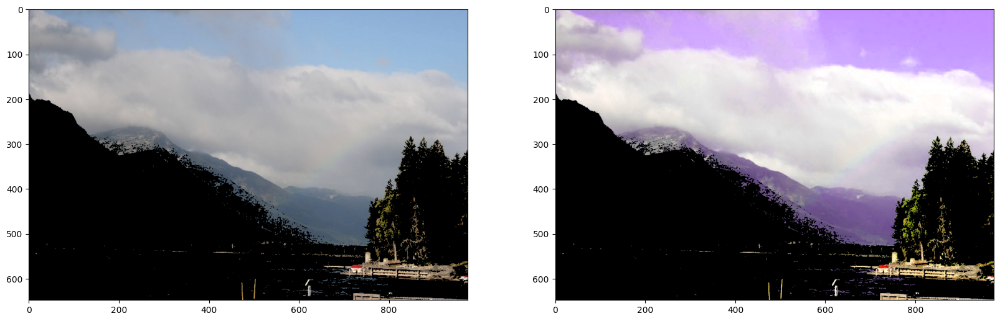

In [179]:
# Try to vary this gain and bias numbers, and see the result
gain = 1.27
bias = 0

img_gray_edited = gain*masked_img + bias
img_gray_edited_unit8 = np.clip(img_gray_edited, 0, 255).astype('uint8')

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(cv2.cvtColor(masked_img, cv2.COLOR_HSV2RGB))
ax2.imshow(cv2.cvtColor(img_gray_edited_unit8, cv2.COLOR_HSV2RGB))
plt.show()

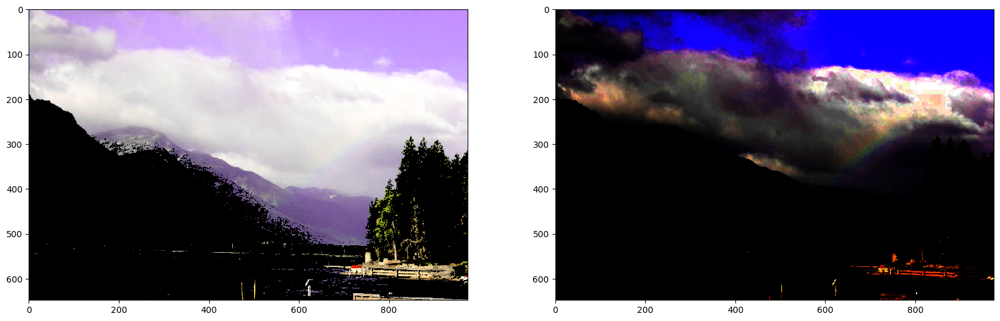

In [197]:
img_rgb2 = cv2.cvtColor(img_gray_edited_unit8, cv2.COLOR_HSV2RGB)
# Try to vary gamma
gamma = 14 #7.5

lookUpTable = np.empty((1,256), np.uint8)
for i in range(256):
    lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)

image_gray_gamma = cv2.LUT(img_rgb2, lookUpTable)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_rgb2, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(image_gray_gamma, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

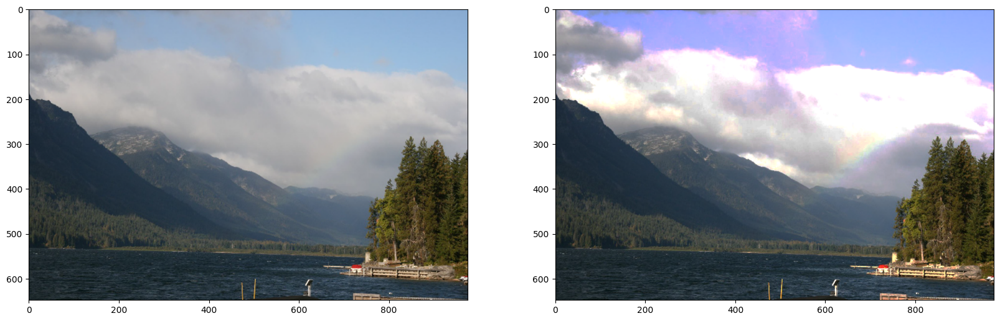

In [198]:
# Add the masked foreground and background.
outImage = cv2.add(img_rgb, image_gray_gamma)
#black = img_rgb.copy()
#black[:,:] = 0
#outImage = cv2.add(outImage,black)
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_rgb)
ax2.imshow(outImage)
plt.show()